# Image Classification (Dogs vs. Cats)

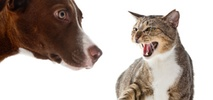

In [39]:
from IPython.display import Image
Image(filename='front_page.png')

## Data

Data can be downloaded at: https://www.kaggle.com/c/dogs-vs-cats/data

In [1]:
import os
import numpy as np
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras import optimizers

Using TensorFlow backend.


In [4]:
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'data/train'
validation_data_dir = 'data/validation'

In [5]:
# used to rescale the pixel values from [0, 255] to [0, 1] interval
datagen = ImageDataGenerator(rescale=1./255)

# automatically retrieve images and their classes for train and validation sets
train_generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=16,
        class_mode='binary')

validation_generator = datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


## Small Conv Net

In [6]:
model = Sequential()
model.add(Convolution2D(32, 3, 3, input_shape=(img_width, img_height,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Convolution2D(32, 3, 3))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Convolution2D(64, 3, 3))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation('sigmoid'))

In [7]:
model.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

### Training

In [8]:
nb_epoch = 30
nb_train_samples = 20000
nb_validation_samples = 5000

In [9]:
model.fit_generator(
        train_generator,
        samples_per_epoch=nb_train_samples,
        nb_epoch=nb_epoch,
        validation_data=validation_generator,
        nb_val_samples=nb_validation_samples)

Epoch 1/30
20000/20000 [==============================] - 152s - loss: 0.6080 - acc: 0.6729 - val_loss: 0.5216 - val_acc: 0.7544

In [10]:
model.save_weights('models/basic_cnn_30_epochs.h5')

### Evaluating on validation set

In [11]:
model.evaluate_generator(validation_generator, nb_validation_samples)

[0.56531570873260495, 0.6754]

We can see that there is clear overfitting because validation accuracy dropped down or saturated as the number of epochs increased

## Data augmentation for improving the model

By applying random transformation to our train set, we artificially enhance our dataset with new unseen images.
This will hopefully reduce overfitting and allows better generalization capability for our network.

In [12]:
train_datagen_augmented = ImageDataGenerator(
        rescale=1./255,        # normalize pixel values to [0,1]
        shear_range=0.2,       # randomly applies shearing transformation
        zoom_range=0.2,        # randomly applies shearing transformation
        horizontal_flip=True)  # randomly flip the images

# same code as before
train_generator_augmented = train_datagen_augmented.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode='binary')

Found 20000 images belonging to 2 classes.


In [13]:
model.fit_generator(
        train_generator_augmented,
        samples_per_epoch=nb_train_samples,
        nb_epoch=nb_epoch,
        validation_data=validation_generator,
        nb_val_samples=nb_validation_samples)

Epoch 1/30
20000/20000 [==============================] - 99s - loss: 0.5172 - acc: 0.7713 - val_loss: 0.3620 - val_acc: 0.8480

In [14]:
model.save_weights('models/augmented_30_epochs.h5')

### Evaluating on validation set

In [15]:
model.evaluate_generator(validation_generator, nb_validation_samples)

[0.4040687355041504, 0.84060000000000001]

Accurcy on validation set improved to 84%

## Transfer Learning (Using a pre-trained model)

Here we use VGG16, a model trained on the ImageNet dataset - which contains millions of images classified in 1000 categories.

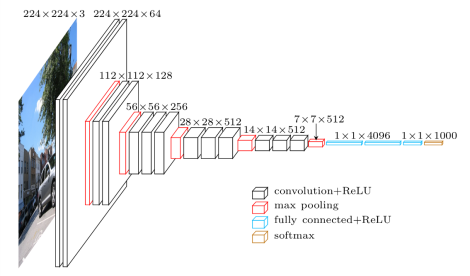

In [40]:
Image(filename='vgg16.png')

In [16]:
model_vgg = Sequential()
model_vgg.add(ZeroPadding2D((1, 1), input_shape=(img_width, img_height,3)))
model_vgg.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_2'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_2'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

### Loading VGG16 weights

The VGG16 weights file can be downloaded from here : https://gist.github.com/baraldilorenzo/07d7802847aaad0a35d3

In [18]:
import h5py
f = h5py.File('models/vgg/vgg16_weights.h5')
for k in range(f.attrs['nb_layers']):
    if k >= len(model_vgg.layers) - 1:
        # we don't look at the last two layers in the savefile (fully-connected and activation)
        break
    g = f['layer_{}'.format(k)]
    weights = [g['param_{}'.format(p)] for p in range(g.attrs['nb_params'])]
    layer = model_vgg.layers[k]

    if layer.__class__.__name__ in ['Convolution1D', 'Convolution2D', 'Convolution3D', 'AtrousConvolution2D']:
        weights[0] = np.transpose(weights[0], (2, 3, 1, 0))

    layer.set_weights(weights)

f.close()

In [19]:
train_generator_bottleneck = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode=None,
        shuffle=False)

validation_generator_bottleneck = datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=32,
        class_mode=None,
        shuffle=False)

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [20]:
bottleneck_features_train = model_vgg.predict_generator(train_generator_bottleneck, nb_train_samples)
np.save(open('models/bottleneck_features_train.npy', 'wb'), bottleneck_features_train)

In [21]:
bottleneck_features_validation = model_vgg.predict_generator(validation_generator_bottleneck, nb_validation_samples)
np.save(open('models/bottleneck_features_validation.npy', 'wb'), bottleneck_features_validation)

In [22]:
train_data = np.load(open('models/bottleneck_features_train.npy', 'rb'))
train_labels = np.array([0] * (nb_train_samples // 2) + [1] * (nb_train_samples // 2))

validation_data = np.load(open('models/bottleneck_features_validation.npy', 'rb'))
validation_labels = np.array([0] * (nb_validation_samples // 2) + [1] * (nb_validation_samples // 2))

### VGG16 + custom fully connected neural network 

In [23]:
model_top = Sequential()
model_top.add(Flatten(input_shape=train_data.shape[1:]))
model_top.add(Dense(256, activation='relu'))
model_top.add(Dropout(0.5))
model_top.add(Dense(1, activation='sigmoid'))

model_top.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [24]:
nb_epoch=40
model_top.fit(train_data, train_labels,
          nb_epoch=nb_epoch, batch_size=32,
          validation_data=(validation_data, validation_labels))

Train on 20000 samples, validate on 5000 samples
Epoch 1/40
20000/20000 [==============================] - 2s - loss: 0.4544 - acc: 0.8103 - val_loss: 0.3530 - val_acc: 0.8522

In [25]:
model_top.save_weights('models/bottleneck_40_epochs.h5')

### Evaluation on validation set

In [26]:
model_top.evaluate(validation_data, validation_labels)

4544/5000 [==========================>...] - ETA: 0s

[0.58022461543679238, 0.87939999999999996]

Accuracy on validation set improved to ~88%

## Fine-tuning the top layers of pre-trained network

In [27]:
model_vgg = Sequential()
model_vgg.add(ZeroPadding2D((1, 1), input_shape=(img_width, img_height,3)))
model_vgg.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(64, 3, 3, activation='relu', name='conv1_2'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(128, 3, 3, activation='relu', name='conv2_2'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(256, 3, 3, activation='relu', name='conv3_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv4_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_1'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_2'))
model_vgg.add(ZeroPadding2D((1, 1)))
model_vgg.add(Convolution2D(512, 3, 3, activation='relu', name='conv5_3'))
model_vgg.add(MaxPooling2D((2, 2), strides=(2, 2)))

In [28]:
import h5py
f = h5py.File('models/vgg/vgg16_weights.h5')
for k in range(f.attrs['nb_layers']):
    if k >= len(model_vgg.layers) - 1:
        # we don't look at the last two layers in the savefile (fully-connected and activation)
        break
    g = f['layer_{}'.format(k)]
    weights = [g['param_{}'.format(p)] for p in range(g.attrs['nb_params'])]
    layer = model_vgg.layers[k]

    if layer.__class__.__name__ in ['Convolution1D', 'Convolution2D', 'Convolution3D', 'AtrousConvolution2D']:
        weights[0] = np.transpose(weights[0], (2, 3, 1, 0))

    layer.set_weights(weights)

f.close()

In [29]:
top_model = Sequential()
top_model.add(Flatten(input_shape=model_vgg.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(1, activation='sigmoid'))

top_model.load_weights('models/bottleneck_40_epochs.h5')

model_vgg.add(top_model)

In [30]:
for layer in model_vgg.layers[:25]:
    layer.trainable = False

In [31]:
# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
model_vgg.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

### Data augmentation

In [32]:
# prepare data augmentation configuration  . . . do we need this?
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        batch_size=32,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_height, img_width),
        batch_size=32,
        class_mode='binary')

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [33]:
# fine-tune the model
model_vgg.fit_generator(
        train_generator,
        samples_per_epoch=nb_train_samples,
        nb_epoch=nb_epoch,
        validation_data=validation_generator,
        nb_val_samples=nb_validation_samples)

Epoch 1/40
20000/20000 [==============================] - 100s - loss: 0.3930 - acc: 0.8387 - val_loss: 0.2779 - val_acc: 0.8872

In [34]:
model_vgg.save_weights('models/finetuning_30epochs_vgg.h5')

In [35]:
model_vgg.load_weights('models/finetuning_30epochs_vgg.h5')

In [36]:
model_vgg.evaluate_generator(validation_generator, nb_validation_samples)

[0.16613109255582095, 0.9466]

This gives a staggering ~95% accuracy on Validation set

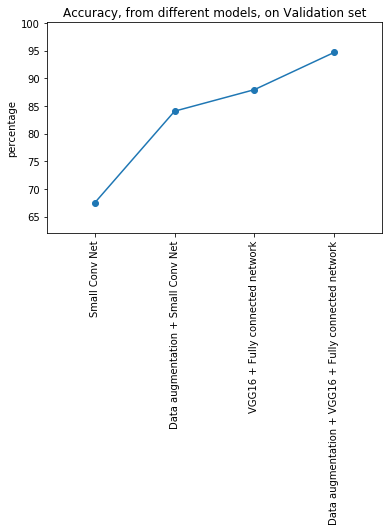

In [46]:
import matplotlib.pyplot as plt

x = [1, 2, 3, 4]
y = [67.54, 84.06, 87.94, 94.66]
labels = ['Small Conv Net',
          'Data augmentation + Small Conv Net',
          'VGG16 + Fully connected network',
          'Data augmentation + VGG16 + Fully connected network']

plt.plot(x, y, '-o')
plt.ylabel('percentage')
plt.title('Accuracy, from different models, on Validation set')
plt.xticks(x, labels, rotation='vertical')
plt.margins(0.2)
plt.subplots_adjust(bottom=0.15)
plt.show()

This clearly shows Data augmentation and Transfer Learning leads to better accuracy